In [141]:
import numpy as np
import soundfile as sf
import librosa
import librosa.display
from matplotlib import pyplot as plt
from skimage import feature, morphology, filters, transform, measure

In [25]:
spec_1 = np.load("spec_1.npy")
spec_2 = np.load("spec_2.npy")
sampling_rate = 44100
spec_1.shape

(2, 1025, 444)

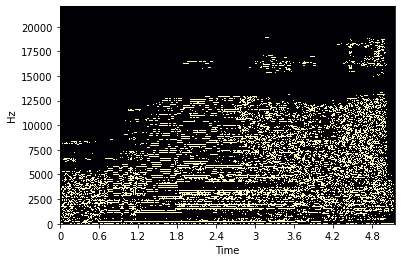

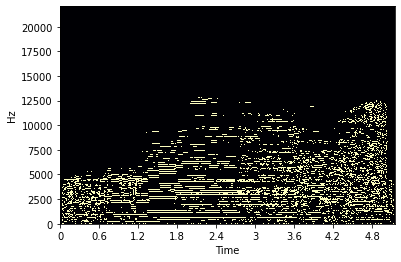

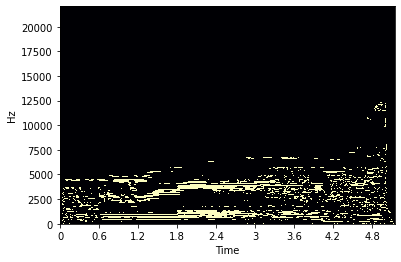

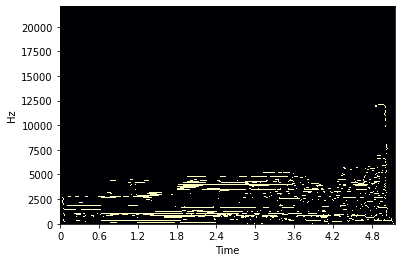

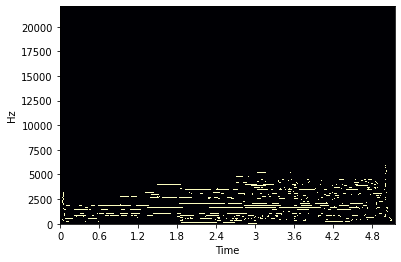

In [30]:
for sigma in np.arange(5):
    canny_1_0 = np.array(feature.canny(spec_1[0], sigma=sigma), dtype=float)
    canny_1_1 = np.array(feature.canny(spec_1[1], sigma=sigma), dtype=float)
    canny_2_0 = np.array(feature.canny(spec_2[0], sigma=sigma), dtype=float)
    canny_2_1 = np.array(feature.canny(spec_2[1], sigma=sigma), dtype=float)
    librosa.display.specshow(librosa.amplitude_to_db(canny_1_0, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
    plt.show()

    canny_audio_1 = librosa.griffinlim(np.array([canny_1_0, canny_1_1]))
    canny_audio_1.shape
    sf.write(f"sound elements/image processing/canny/canny_1_{sigma}.aiff", canny_audio_1.T, sampling_rate)

    canny_audio_2 = librosa.griffinlim(np.array([canny_2_0, canny_2_1]))
    canny_audio_2.shape
    sf.write(f"sound elements/image processing/canny/canny_2_{sigma}.aiff", canny_audio_2.T, sampling_rate)

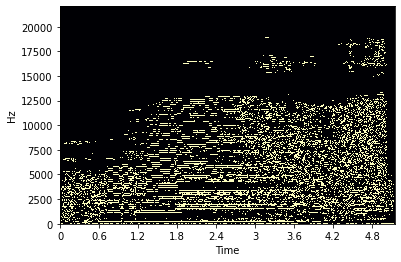

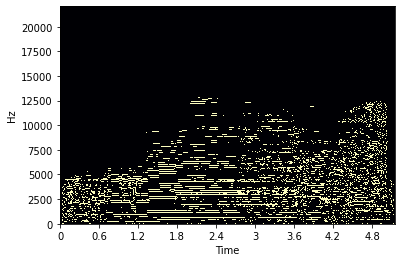

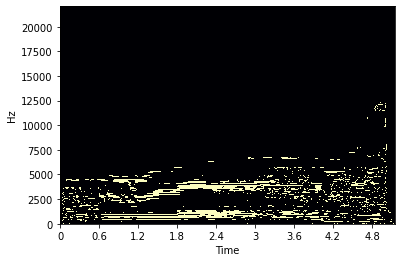

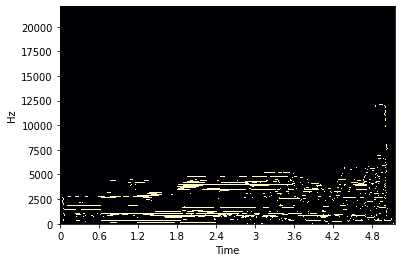

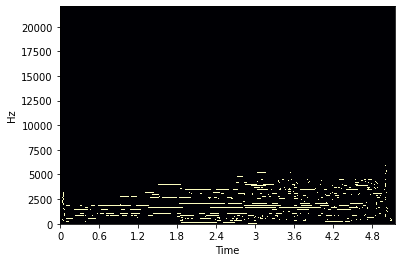

In [52]:
for sigma in np.arange(5):
    canny_1_0 = np.array(feature.canny(spec_1[0], sigma=sigma), dtype=float)
    canny_1_1 = np.array(feature.canny(spec_1[1], sigma=sigma), dtype=float)
    canny_2_0 = np.array(feature.canny(spec_2[0], sigma=sigma), dtype=float)
    canny_2_1 = np.array(feature.canny(spec_2[1], sigma=sigma), dtype=float)

    skeleton_1_0 = np.array(morphology.skeletonize(canny_1_0), dtype=float)
    skeleton_1_1 = np.array(morphology.skeletonize(canny_1_1), dtype=float)
    skeleton_2_0 = np.array(morphology.skeletonize(canny_2_0), dtype=float)
    skeleton_2_1 = np.array(morphology.skeletonize(canny_2_1), dtype=float)
    librosa.display.specshow(librosa.amplitude_to_db(skeleton_1_0, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
    plt.show()

    skeleton_audio_1 = librosa.griffinlim(np.array([skeleton_1_0, skeleton_1_1]))
    sf.write(f"sound elements/image processing/skeleton/skeleton_1_{sigma}.aiff", skeleton_audio_1.T, sampling_rate)

    skeleton_audio_2 = librosa.griffinlim(np.array([skeleton_2_0, skeleton_2_1]))
    sf.write(f"sound elements/image processing/skeleton/skeleton_2_{sigma}.aiff", skeleton_audio_2.T, sampling_rate)

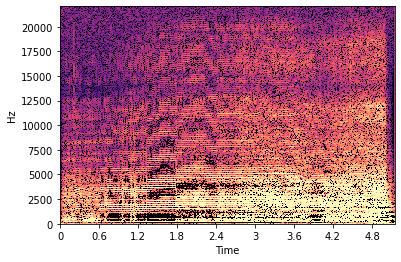

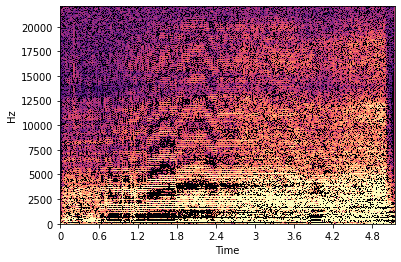

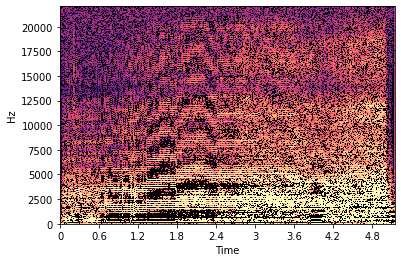

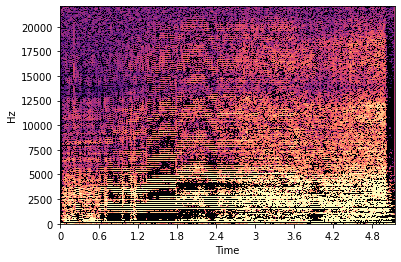

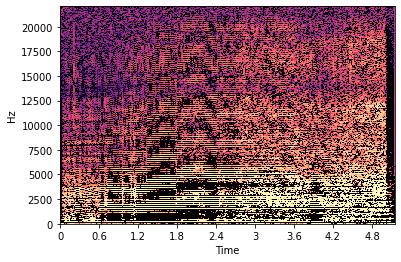

...

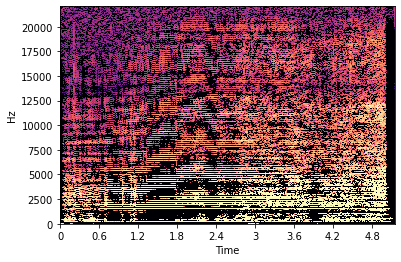

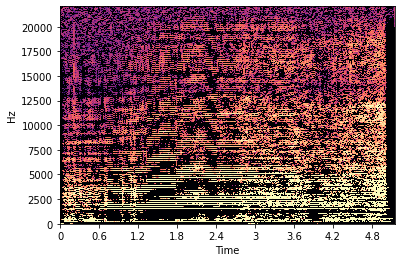

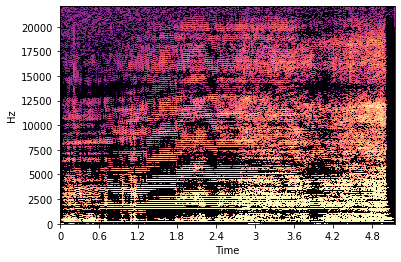

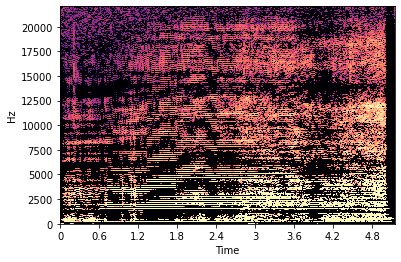

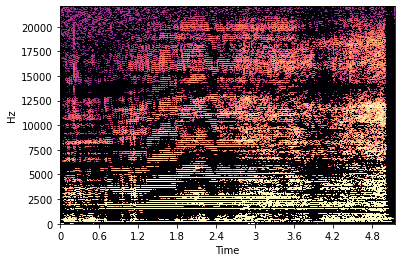

In [59]:
for radius in 4**np.arange(4):
    for amount in np.arange(1, 4):
        unsharp_1_0 = np.array(filters.unsharp_mask(spec_1[0], radius=radius, amount=amount), dtype=float)
        unsharp_1_1 = np.array(filters.unsharp_mask(spec_1[1], radius=radius, amount=amount), dtype=float)
        unsharp_2_0 = np.array(filters.unsharp_mask(spec_2[0], radius=radius, amount=amount), dtype=float)
        unsharp_2_1 = np.array(filters.unsharp_mask(spec_2[1], radius=radius, amount=amount), dtype=float)
        librosa.display.specshow(librosa.amplitude_to_db(unsharp_1_0, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
        plt.show()

        unsharp_audio_1 = librosa.griffinlim(np.array([unsharp_1_0, unsharp_1_1]))
        sf.write(f"sound elements/image processing/unsharp/unsharp_1_{radius}_{amount}.aiff", unsharp_audio_1.T, sampling_rate)

        unsharp_audio_2 = librosa.griffinlim(np.array([unsharp_2_0, unsharp_2_1]))
        sf.write(f"sound elements/image processing/unsharp/unsharp_2_{radius}_{amount}.aiff", unsharp_audio_2.T, sampling_rate)

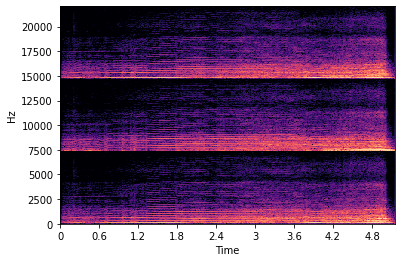

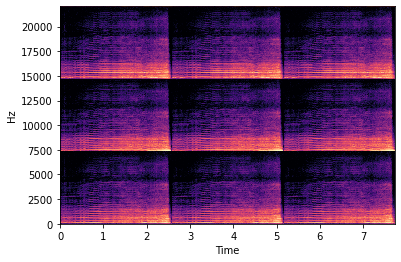

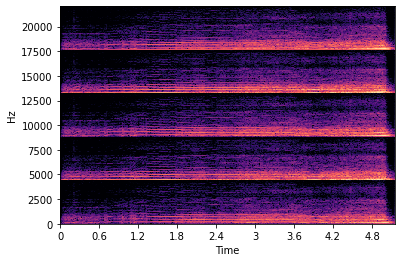

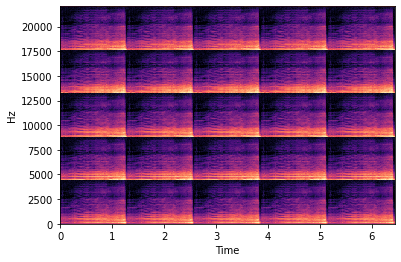

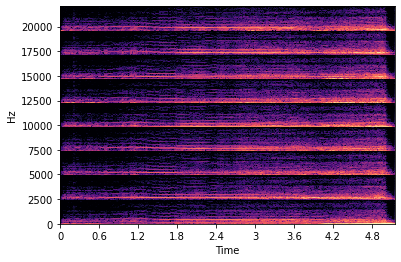

...

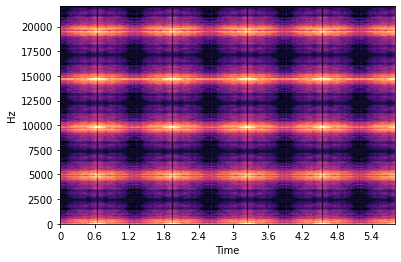

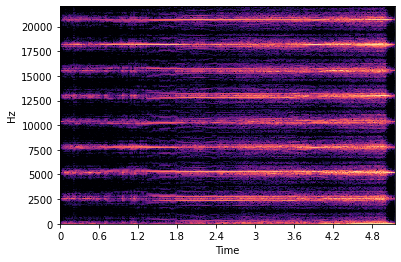

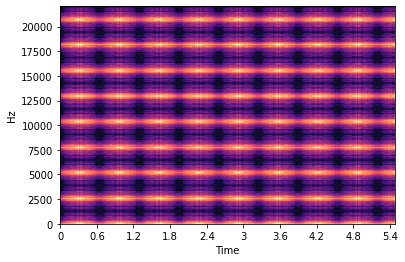

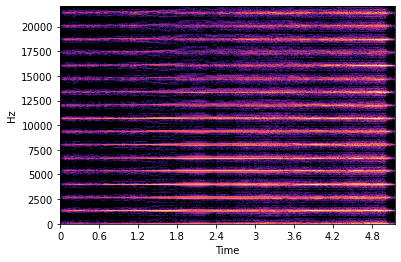

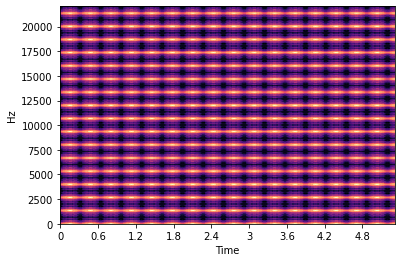

In [124]:
modes = ['wrap', 'reflect', 'symmetric']

for mode in modes:
    for i in 2**np.arange(1, 6):
        resized_1_0 = transform.rescale(spec_1[0], 1 / i)
        padded_1_0 = np.pad(spec_1[0], pad_width=((0, spec_1.shape[1] * i), (0, 0)), mode=mode)
        gridded_1_0 = np.pad(resized_1_0, pad_width=((0, spec_1.shape[1]), (0, spec_1.shape[2])), mode=mode)
        resized_1_1 = transform.rescale(spec_1[1], 1 / i)
        padded_1_1 = np.pad(spec_1[1], pad_width=((0, spec_1.shape[1] * i), (0, 0)), mode=mode)
        gridded_1_1 = np.pad(resized_1_1, pad_width=((0, spec_1.shape[1]), (0, spec_1.shape[2])), mode=mode)
        
        resized_2_0 = transform.rescale(spec_2[0], 1 / i)
        padded_2_0 = np.pad(spec_2[0], pad_width=((0, spec_2.shape[1] * i), (0, 0)), mode=mode)
        gridded_2_0 = np.pad(resized_2_0, pad_width=((0, spec_2.shape[1]), (0, spec_2.shape[2])), mode=mode)
        resized_2_1 = transform.rescale(spec_2[1], 1 / i)
        padded_2_1 = np.pad(spec_2[1], pad_width=((0, spec_2.shape[1] * i), (0, 0)), mode=mode)
        gridded_2_1 = np.pad(resized_2_1, pad_width=((0, spec_2.shape[1]), (0, spec_2.shape[2])), mode=mode)

        librosa.display.specshow(librosa.amplitude_to_db(padded_1_0, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
        plt.show()
        librosa.display.specshow(librosa.amplitude_to_db(gridded_1_0, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
        plt.show()
        
        padded_audio_1 = librosa.griffinlim(np.array([padded_1_0, padded_1_1]))
        sf.write(f"sound elements/image processing/padded/padded_{mode}_{i}_1.aiff", padded_audio_1.T, sampling_rate)
        gridded_audio_1 = librosa.griffinlim(np.array([gridded_1_0, gridded_1_1]))
        sf.write(f"sound elements/image processing/grid/grid_{mode}_{i}_1.aiff", gridded_audio_1.T, sampling_rate)
        padded_audio_2 = librosa.griffinlim(np.array([padded_2_0, padded_2_1]))
        sf.write(f"sound elements/image processing/padded/padded_{mode}_{i}_2.aiff", padded_audio_2.T, sampling_rate)
        gridded_audio_2 = librosa.griffinlim(np.array([gridded_2_0, gridded_2_1]))
        sf.write(f"sound elements/image processing/grid/grid_{mode}_{i}_2.aiff", gridded_audio_2.T, sampling_rate)        

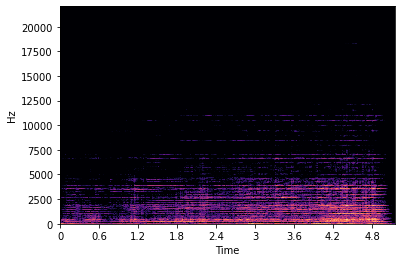

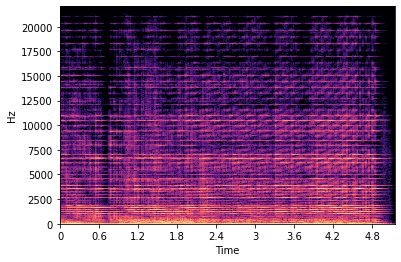

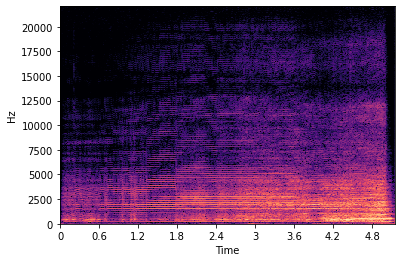

In [119]:
am = librosa.griffinlim(np.array([spec_1[0] * spec_2[0], spec_1[1] * spec_2[1]]))
am_1 = librosa.griffinlim(np.array([(np.max(spec_1) - spec_1[0]) * spec_2[0], (np.max(spec_1) - spec_1[1]) * spec_2[1]]) / 10)
am_2 = librosa.griffinlim(np.array([spec_1[0] * (np.max(spec_2) - spec_2[0]), spec_1[1] * (np.max(spec_2) - spec_2[1])]) / 10)
librosa.display.specshow(librosa.amplitude_to_db(spec_1[0] * spec_2[0], ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
plt.show()
librosa.display.specshow(librosa.amplitude_to_db((np.max(spec_1) - spec_1[0]) * spec_2[0], ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
plt.show()
librosa.display.specshow(librosa.amplitude_to_db(spec_1[0] * (np.max(spec_2) - spec_2[0]), ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
plt.show()
sf.write(f"sound elements/image processing/AM/AM.aiff", am.T, sampling_rate)
sf.write(f"sound elements/image processing/AM/AM_1.aiff", am_1.T, sampling_rate)
sf.write(f"sound elements/image processing/AM/AM_2.aiff", am_2.T, sampling_rate)

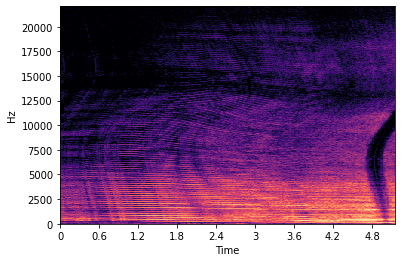

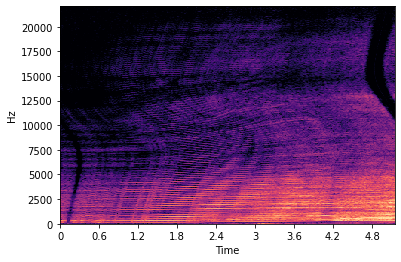

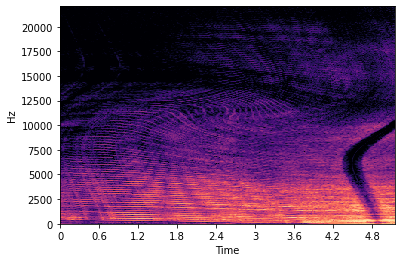

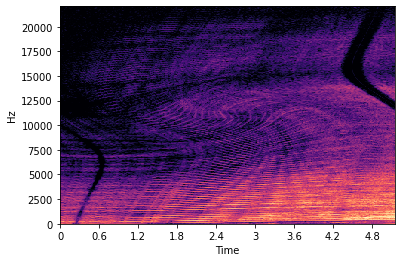

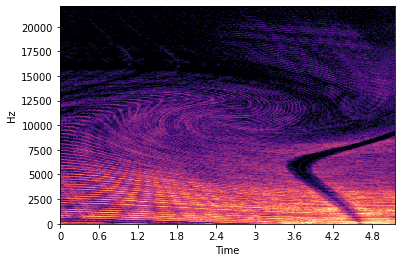

...

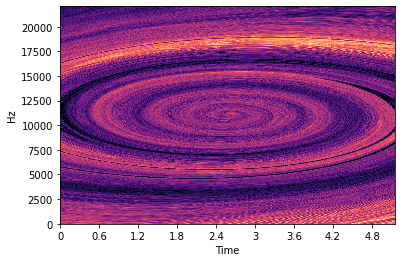

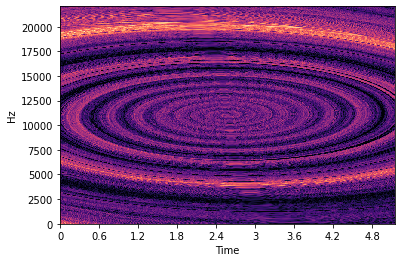

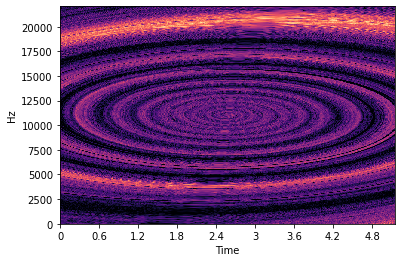

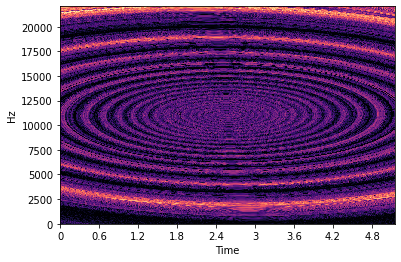

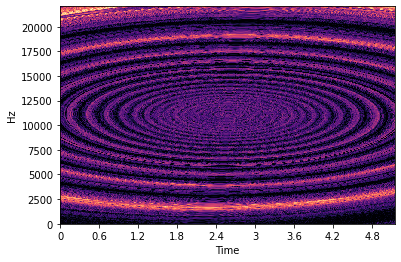

In [140]:
for i in 2**np.arange(8):
    swirled_1_0_p = transform.swirl(spec_1[0], rotation=0, strength=i, radius=spec_1.shape[1])
    swirled_1_0_n = transform.swirl(spec_1[0], rotation=0, strength=-i, radius=spec_1.shape[1])
    swirled_1_1_p = transform.swirl(spec_1[1], rotation=0, strength=i, radius=spec_1.shape[1])
    swirled_1_1_n = transform.swirl(spec_1[1], rotation=0, strength=-i, radius=spec_1.shape[1])
    swirled_2_0_p = transform.swirl(spec_2[0], rotation=0, strength=i, radius=spec_2.shape[1])
    swirled_2_0_n = transform.swirl(spec_2[0], rotation=0, strength=-i, radius=spec_2.shape[1])
    swirled_2_1_p = transform.swirl(spec_2[1], rotation=0, strength=i, radius=spec_2.shape[1])
    swirled_2_1_n = transform.swirl(spec_2[1], rotation=0, strength=-i, radius=spec_2.shape[1])
    librosa.display.specshow(librosa.amplitude_to_db(swirled_1_0_p, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
    plt.show()
    librosa.display.specshow(librosa.amplitude_to_db(swirled_1_0_n, ref=np.max), sr=sampling_rate, x_axis='time', y_axis='linear')
    plt.show()
    
    swirled_1_p_audio = librosa.griffinlim(np.array([swirled_1_0_p, swirled_1_1_p]))
    sf.write(f"sound elements/image processing/swirl/swirl_1_{i}_p.aiff", swirled_1_p_audio.T, sampling_rate)
    swirled_1_n_audio = librosa.griffinlim(np.array([swirled_1_0_n, swirled_1_1_n]))
    sf.write(f"sound elements/image processing/swirl/swirl_1_{i}_n.aiff", swirled_1_n_audio.T, sampling_rate)
    swirled_2_p_audio = librosa.griffinlim(np.array([swirled_2_0_p, swirled_2_1_p]))
    sf.write(f"sound elements/image processing/swirl/swirl_2_{i}_p.aiff", swirled_2_p_audio.T, sampling_rate)
    swirled_2_n_audio = librosa.griffinlim(np.array([swirled_2_0_n, swirled_2_1_n]))
    sf.write(f"sound elements/image processing/swirl/swirl_2_{i}_n.aiff", swirled_2_n_audio.T, sampling_rate)

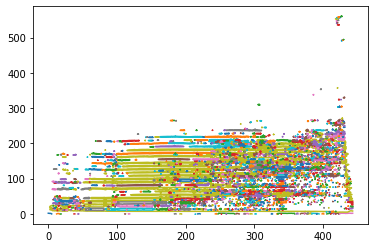